# ***Adding Speckle Noise to Data:***

## Defining Functions and Subroutines:

Importing Libraries:

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from google.colab import drive

Uniform Phase Distribution Function:

In [ ]:
def UniformPhase(mean,var):

    phase = np.random.uniform(-np.pi,np.pi)

    return phase

Constant Magnitude Function:

In [ ]:
def ConstantMag(mean,var):

    mag = mean

    return mag

Random Phasor Generator Function:

In [ ]:
def randomPhasor(magDist,magMean,magVar,phaseDist,phaseMean,phaseVar):

    mag = magDist(magMean,magVar)
    phase = phaseDist(phaseMean,phaseVar)

    phasor = np.multiply(mag,np.exp(1j*phase))

    return phasor

Random Phasor Sum Function:

In [ ]:
def randomPhasorSum(N,magDist,magMean,magVar,phaseDist,phaseMean,phaseVar):
    phasor = np.zeros(N,dtype=complex)

    for i in range(N):
        phasor[i] = randomPhasor(magDist,magMean,magVar,phaseDist,phaseMean,phaseVar)

    phasorsum = np.divide(np.sum(phasor),np.sqrt(N))

    return phasorsum

Getting Directory Length Function:

In [ ]:
def get_directory_length(directory):

    # List all files and directories in the given directory
    items = os.listdir(directory)

    # Return the length of the list

    return len(items)

## Image Processing:

Mounting Google Drive:

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Data Directories:

In [ ]:
input_CNV_dir = '/content/drive/MyDrive/OCT Resized/train/CNV'
input_DME_dir = '/content/drive/MyDrive/OCT Resized/train/DME'
input_DRUSEN_dir = '/content/drive/MyDrive/OCT Resized/train/DRUSEN'
input_NORMAL_dir = '/content/drive/MyDrive/OCT Resized/train/NORMAL'

input_CNV_test_dir = '/content/drive/MyDrive/OCT Resized/test/CNV'
input_DME_test_dir = '/content/drive/MyDrive/OCT Resized/test/DME'
input_DRUSEN_test_dir = '/content/drive/MyDrive/OCT Resized/test/DRUSEN'
input_NORMAL_test_dir = '/content/drive/MyDrive/OCT Resized/test/NORMAL'

### Low Speckle Noise (α = 10):

Output Data Directories:

In [ ]:
output_CNV_dir = '/content/drive/MyDrive/OCT Low Speckle/train/CNV'
output_DME_dir = '/content/drive/MyDrive/OCT Low Speckle/train/DME'
output_DRUSEN_dir = '/content/drive/MyDrive/OCT Low Speckle/train/DRUSEN'
output_NORMAL_dir = '/content/drive/MyDrive/OCT Low Speckle/train/NORMAL'

output_CNV_test_dir = '/content/drive/MyDrive/OCT Low Speckle/test/CNV'
output_DME_test_dir = '/content/drive/MyDrive/OCT Low Speckle/test/DME'
output_DRUSEN_test_dir = '/content/drive/MyDrive/OCT Low Speckle/test/DRUSEN'
output_NORMAL_test_dir = '/content/drive/MyDrive/OCT Low Speckle/test/NORMAL'

Speckle Noise Parameters:

In [ ]:
magDist = ConstantMag
phaseDist = UniformPhase

N = 50

magMean = 10
magVar = 1
phaseMean = 10
phaseVar = 1

alpha = 10

image_size = 256

H = image_size
W = image_size

phaseSum = np.zeros((H,W),dtype=complex)

for k in range(H):
  for l in range(W):
      phaseSum[k,l] = randomPhasorSum(N,magDist,magMean,magVar,phaseDist,phaseMean,phaseVar)

**TRAINING DATASETS:**

1. Chroidal Neovascularization (CNV) Data:

In [ ]:
os.chdir(input_CNV_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/CNV


In [ ]:
CNV_length = get_directory_length(input_CNV_dir)

CNV_images = os.listdir(input_CNV_dir)

Adding Speckle Noise to the Data (α = 10):

In [ ]:
for i in range(CNV_length):
  pic = cv2.imread(CNV_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_CNV_dir)
  cv2.imwrite(CNV_images[i],newpic)
  os.chdir(input_CNV_dir)
  print(str(i+1)+"images have been modified")

Streaming output truncated to the last 5000 lines.
4496images have been modified
4497images have been modified
4498images have been modified
4499images have been modified
4500images have been modified
4501images have been modified
4502images have been modified
4503images have been modified
4504images have been modified
4505images have been modified
4506images have been modified
4507images have been modified
4508images have been modified
4509images have been modified
4510images have been modified
4511images have been modified
4512images have been modified
4513images have been modified
4514images have been modified
4515images have been modified
4516images have been modified
4517images have been modified
4518images have been modified
4519images have been modified
4520images have been modified
4521images have been modified
4522images have been modified
4523images have been modified
4524images have been modified
4525images have been modified
4526images have been modified
4527images have bee

Verifying Speckle Addition:

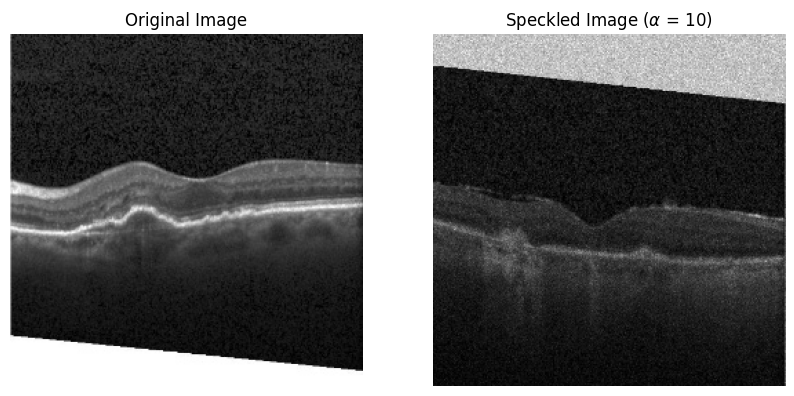

In [ ]:
rand_indx = np.random.randint(0,CNV_length)

plt.figure(figsize=(10,10))

os.chdir(input_CNV_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(CNV_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_CNV_dir)

CNV_output_images = os.listdir(output_CNV_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(CNV_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

2. Diabetic Macular Edema (DME) Data:

In [ ]:
os.chdir(input_DME_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/DME


In [ ]:
DME_length = get_directory_length(input_DME_dir)

DME_images = os.listdir(input_DME_dir)

Adding Speckle Noise to Data (α = 10):

In [ ]:
for i in range(DME_length):
  pic = cv2.imread(DME_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DME_dir)
  cv2.imwrite(DME_images[i],newpic)
  os.chdir(input_DME_dir)
  print(str(i)+" images have been modified")

Streaming output truncated to the last 5000 lines.
5144 images have been modified
5145 images have been modified
5146 images have been modified
5147 images have been modified
5148 images have been modified
5149 images have been modified
5150 images have been modified
5151 images have been modified
5152 images have been modified
5153 images have been modified
5154 images have been modified
5155 images have been modified
5156 images have been modified
5157 images have been modified
5158 images have been modified
5159 images have been modified
5160 images have been modified
5161 images have been modified
5162 images have been modified
5163 images have been modified
5164 images have been modified
5165 images have been modified
5166 images have been modified
5167 images have been modified
5168 images have been modified
5169 images have been modified
5170 images have been modified
5171 images have been modified
5172 images have been modified
5173 images have been modified
5174 images have be

Verifying Speckle Addition:

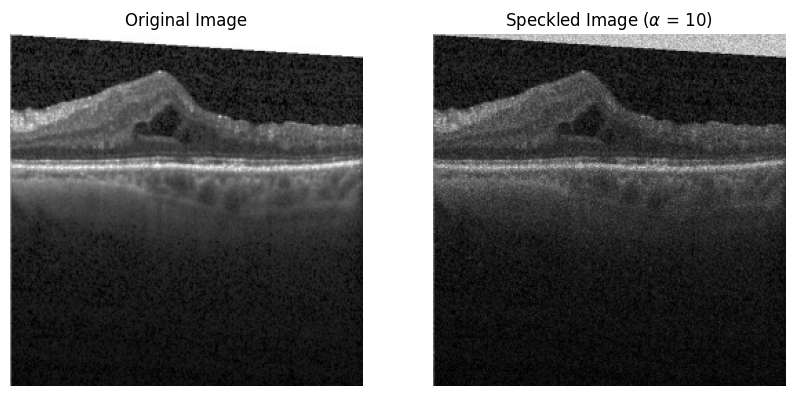

In [ ]:
rand_indx = np.random.randint(0,DME_length)

plt.figure(figsize=(10,10))

os.chdir(input_DME_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DME_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DME_dir)

DME_output_images = os.listdir(output_DME_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DME_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

3. Drusen (DRUSEN) Data:

In [ ]:
os.chdir(input_DRUSEN_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/DRUSEN


In [ ]:
DRUSEN_length = get_directory_length(input_DRUSEN_dir)

DRUSEN_images = os.listdir(input_DRUSEN_dir)

Adding Speckle Noise to Data (α = 10):

In [ ]:
for i in range(DRUSEN_length):
  pic = cv2.imread(DRUSEN_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DRUSEN_dir)
  cv2.imwrite(DRUSEN_images[i],newpic)
  os.chdir(input_DRUSEN_dir)
  print(str(i+1)+" images have been modified")

Streaming output truncated to the last 5000 lines.
372 images have been modified
373 images have been modified
374 images have been modified
375 images have been modified
376 images have been modified
377 images have been modified
378 images have been modified
379 images have been modified
380 images have been modified
381 images have been modified
382 images have been modified
383 images have been modified
384 images have been modified
385 images have been modified
386 images have been modified
387 images have been modified
388 images have been modified
389 images have been modified
390 images have been modified
391 images have been modified
392 images have been modified
393 images have been modified
394 images have been modified
395 images have been modified
396 images have been modified
397 images have been modified
398 images have been modified
399 images have been modified
400 images have been modified
401 images have been modified
402 images have been modified
403 images have bee

Verifying Speckle Addition:

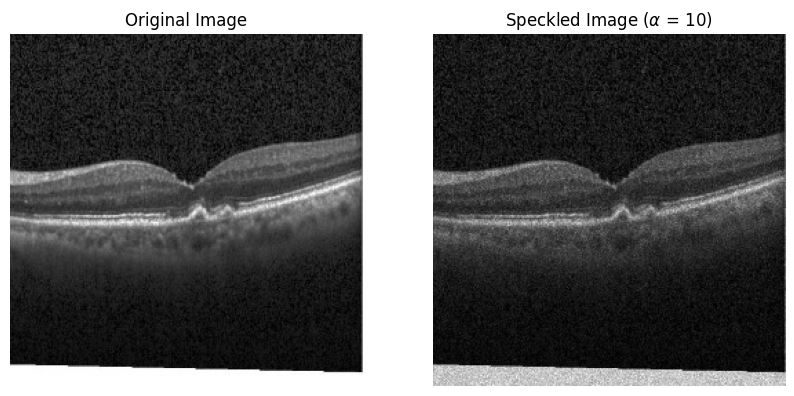

In [ ]:
rand_indx = np.random.randint(0,DRUSEN_length)

plt.figure(figsize=(10,10))

os.chdir(input_DRUSEN_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DRUSEN_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DRUSEN_dir)

DRUSEN_output_images = os.listdir(output_DRUSEN_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DRUSEN_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

4. Normal (NORMAL) Data:

In [ ]:
os.chdir(input_NORMAL_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/NORMAL


In [ ]:
NORMAL_length = get_directory_length(input_NORMAL_dir)

NORMAL_images = os.listdir(input_NORMAL_dir)

Adding Speckle Noise to Data (α = 10):

In [ ]:
for i in range(NORMAL_length):
  pic = cv2.imread(NORMAL_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_NORMAL_dir)
  cv2.imwrite(NORMAL_images[i],newpic)
  os.chdir(input_NORMAL_dir)
  print(str(i+1)+" images have been modified")

Streaming output truncated to the last 5000 lines.
11337 images have been modified
11338 images have been modified
11339 images have been modified
11340 images have been modified
11341 images have been modified
11342 images have been modified
11343 images have been modified
11344 images have been modified
11345 images have been modified
11346 images have been modified
11347 images have been modified
11348 images have been modified
11349 images have been modified
11350 images have been modified
11351 images have been modified
11352 images have been modified
11353 images have been modified
11354 images have been modified
11355 images have been modified
11356 images have been modified
11357 images have been modified
11358 images have been modified
11359 images have been modified
11360 images have been modified
11361 images have been modified
11362 images have been modified
11363 images have been modified
11364 images have been modified
11365 images have been modified
11366 images have bee

Verifying Speckle Addition:

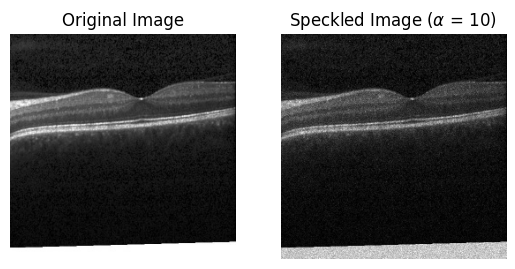

In [ ]:
rand_indx = np.random.randint(0,NORMAL_length)

os.chdir(input_NORMAL_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(NORMAL_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_NORMAL_dir)

NORMAL_output_images = os.listdir(output_NORMAL_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(NORMAL_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

**TEST DATASETS:**

1. Chroidal Neovascularization (CNV) Data:

In [ ]:
os.chdir(input_CNV_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/CNV


In [ ]:
CNV_test_length = get_directory_length(input_CNV_test_dir)

CNV_test_images = os.listdir(input_CNV_test_dir)

Adding Speckle Noise to Data (α = 10):

In [ ]:
for i in range(CNV_test_length):
  pic = cv2.imread(CNV_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_CNV_test_dir)
  cv2.imwrite(CNV_test_images[i],newpic)
  os.chdir(input_CNV_test_dir)
  print(str(i+1)+" images have been modified")

1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modified
35 images have been mod

Verifying Speckle Addition:

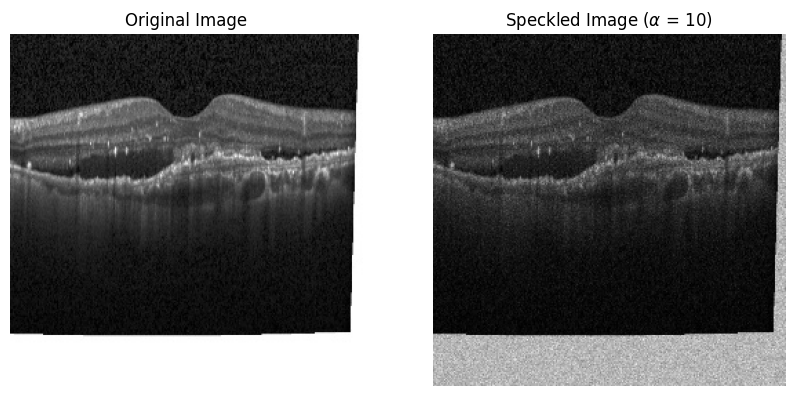

In [ ]:
rand_indx = np.random.randint(0,CNV_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_CNV_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(CNV_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_CNV_test_dir)

CNV_test_output_images = os.listdir(output_CNV_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(CNV_test_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

2. Diabetic Macular Edema (DME) Data:

In [ ]:
os.chdir(input_DME_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/DME


In [ ]:
DME_test_length = get_directory_length(input_DME_test_dir)

DME_test_images = os.listdir(input_DME_test_dir)

Adding Speckle Noise to Data (α = 10):

In [ ]:
for i in range(DME_test_length):
  pic = cv2.imread(DME_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DME_test_dir)
  cv2.imwrite(DME_test_images[i],newpic)
  os.chdir(input_DME_test_dir)
  print(str(i+1)+" images have been modified")

1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modified
35 images have been mod

Verifying Speckle Addition:

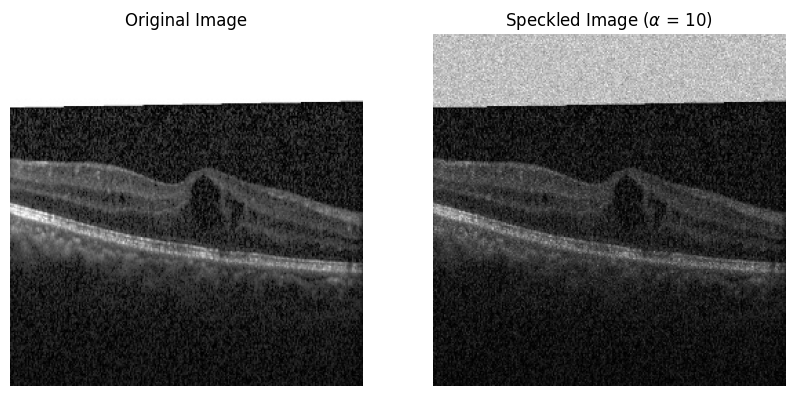

In [ ]:
rand_indx = np.random.randint(0,DME_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_DME_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DME_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DME_test_dir)

DME_test_output_images = os.listdir(output_DME_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DME_test_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

3. Drusen (DRUSEN) Data:

In [ ]:
os.chdir(input_DRUSEN_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/DRUSEN


In [ ]:
DRUSEN_test_length = get_directory_length(input_DRUSEN_test_dir)

DRUSEN_test_images = os.listdir(input_DRUSEN_test_dir)

Adding Speckle Noise to Data (α = 10):

In [ ]:
for i in range(DRUSEN_test_length):
  pic = cv2.imread(DRUSEN_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DRUSEN_test_dir)
  cv2.imwrite(DRUSEN_test_images[i],newpic)
  os.chdir(input_DRUSEN_test_dir)
  print(str(i+1)+" images have been modified")

1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modified
35 images have been mod

Verifying Speckle Addition:

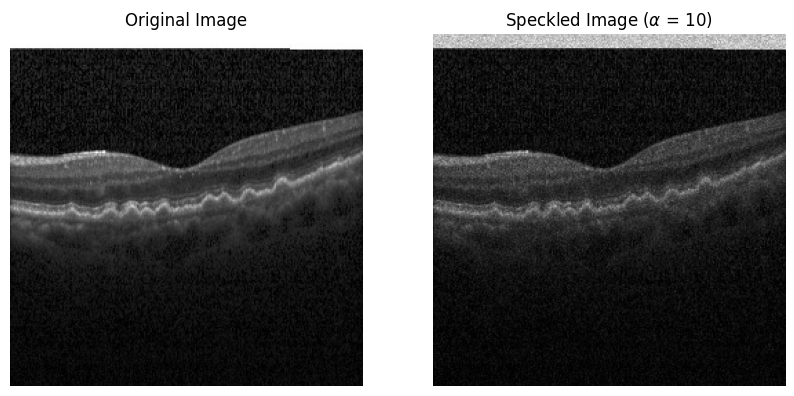

In [ ]:
rand_indx = np.random.randint(0,DRUSEN_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_DRUSEN_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DRUSEN_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DRUSEN_test_dir)

DRUSEN_test_output_images = os.listdir(output_DRUSEN_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DRUSEN_test_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

4. Normal (NORMAL) Data:

In [ ]:
os.chdir(input_NORMAL_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/NORMAL


In [ ]:
NORMAL_test_length = get_directory_length(input_NORMAL_test_dir)

NORMAL_test_images = os.listdir(input_NORMAL_test_dir)

Adding Speckle Noise to Data (α = 10):

In [ ]:
for i in range(NORMAL_test_length):
  pic = cv2.imread(NORMAL_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_NORMAL_test_dir)
  cv2.imwrite(NORMAL_test_images[i],newpic)
  os.chdir(input_NORMAL_test_dir)
  print(str(i+1)+" images have been modified")

1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modified
35 images have been mod

Verifying Speckle Addition:

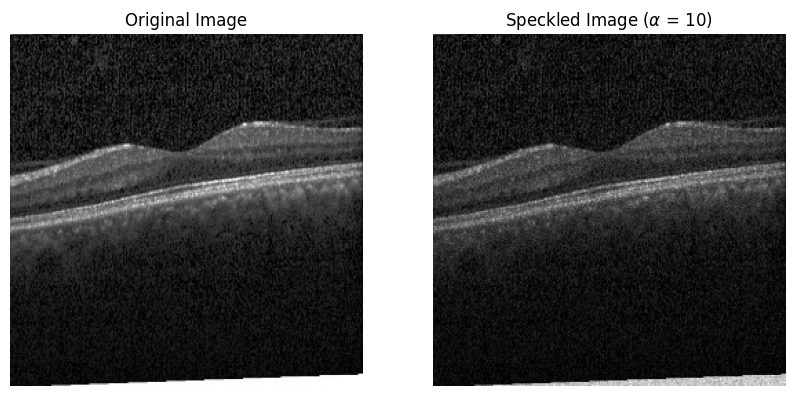

In [ ]:
rand_indx = np.random.randint(0,NORMAL_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_NORMAL_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(NORMAL_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_NORMAL_test_dir)

NORMAL_test_output_images = os.listdir(output_NORMAL_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(NORMAL_test_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

### Medium Speckle Noise (α = 5):

Output Data Directories:

In [ ]:
output_CNV_dir = '/content/drive/MyDrive/OCT Mid Speckle/train/CNV'
output_DME_dir = '/content/drive/MyDrive/OCT Mid Speckle/train/DME'
output_DRUSEN_dir = '/content/drive/MyDrive/OCT Mid Speckle/train/DRUSEN'
output_NORMAL_dir = '/content/drive/MyDrive/OCT Mid Speckle/train/NORMAL'

output_CNV_test_dir = '/content/drive/MyDrive/OCT Mid Speckle/test/CNV'
output_DME_test_dir = '/content/drive/MyDrive/OCT Mid Speckle/test/DME'
output_DRUSEN_test_dir = '/content/drive/MyDrive/OCT Mid Speckle/test/DRUSEN'
output_NORMAL_test_dir = '/content/drive/MyDrive/OCT Mid Speckle/test/NORMAL'

Speckle Noise Parameters:

In [ ]:
magDist = ConstantMag
phaseDist = UniformPhase

N = 50

magMean = 10
magVar = 1
phaseMean = 10
phaseVar = 1

alpha = 5

image_size = 256

H = image_size
W = image_size

phaseSum = np.zeros((H,W),dtype=complex)

for k in range(H):
  for l in range(W):
      phaseSum[k,l] = randomPhasorSum(N,magDist,magMean,magVar,phaseDist,phaseMean,phaseVar)

**TRAINING DATASETS:**

1. Chroidal Neovascularization (CNV) Data:

In [ ]:
os.chdir(input_CNV_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/CNV


In [ ]:
CNV_length = get_directory_length(input_CNV_dir)

CNV_images = os.listdir(input_CNV_dir)

Adding Speckle Noise to the Data (α = 5):

In [ ]:
for i in range(CNV_length):
  pic = cv2.imread(CNV_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_CNV_dir)
  cv2.imwrite(CNV_images[i],newpic)
  os.chdir(input_CNV_dir)
  print(str(i+1)+" images have been modified")

Streaming output truncated to the last 5000 lines.
4496 images have been modified
4497 images have been modified
4498 images have been modified
4499 images have been modified
4500 images have been modified
4501 images have been modified
4502 images have been modified
4503 images have been modified
4504 images have been modified
4505 images have been modified
4506 images have been modified
4507 images have been modified
4508 images have been modified
4509 images have been modified
4510 images have been modified
4511 images have been modified
4512 images have been modified
4513 images have been modified
4514 images have been modified
4515 images have been modified
4516 images have been modified
4517 images have been modified
4518 images have been modified
4519 images have been modified
4520 images have been modified
4521 images have been modified
4522 images have been modified
4523 images have been modified
4524 images have been modified
4525 images have been modified
4526 images have be

Verifying Speckle Addition:

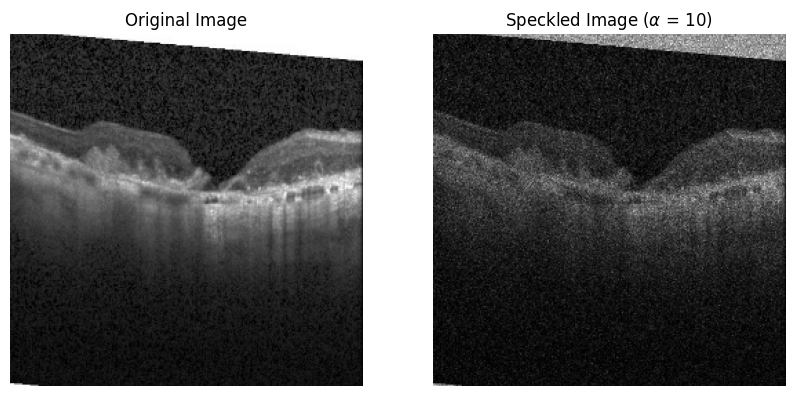

In [ ]:
rand_indx = np.random.randint(0,CNV_length)

plt.figure(figsize=(10,10))

os.chdir(input_CNV_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(CNV_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_CNV_dir)

CNV_output_images = os.listdir(output_CNV_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(CNV_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

2. Diabetic Macular Edema (DME) Data:

In [ ]:
os.chdir(input_DME_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/DME


In [ ]:
DME_length = get_directory_length(input_DME_dir)

DME_images = os.listdir(input_DME_dir)

Adding Speckle Noise to Data (α = 5):

In [ ]:
for i in range(DME_length):
  pic = cv2.imread(DME_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DME_dir)
  cv2.imwrite(DME_images[i],newpic)
  os.chdir(input_DME_dir)
  print(str(i)+"images have been modified")

Streaming output truncated to the last 5000 lines.
5144images have been modified
5145images have been modified
5146images have been modified
5147images have been modified
5148images have been modified
5149images have been modified
5150images have been modified
5151images have been modified
5152images have been modified
5153images have been modified
5154images have been modified
5155images have been modified
5156images have been modified
5157images have been modified
5158images have been modified
5159images have been modified
5160images have been modified
5161images have been modified
5162images have been modified
5163images have been modified
5164images have been modified
5165images have been modified
5166images have been modified
5167images have been modified
5168images have been modified
5169images have been modified
5170images have been modified
5171images have been modified
5172images have been modified
5173images have been modified
5174images have been modified
5175images have bee

Verifying Speckle Addition:

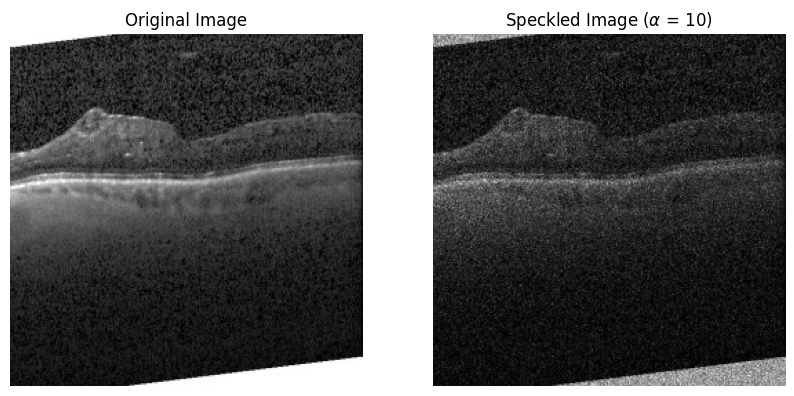

In [ ]:
rand_indx = np.random.randint(0,DME_length)

plt.figure(figsize=(10,10))

os.chdir(input_DME_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DME_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DME_dir)

DME_output_images = os.listdir(output_DME_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DME_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

3. Drusen (DRUSEN) Data:

In [ ]:
os.chdir(input_DRUSEN_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/DRUSEN


In [ ]:
DRUSEN_length = get_directory_length(input_DRUSEN_dir)

DRUSEN_images = os.listdir(input_DRUSEN_dir)

Adding Speckle Noise to Data (α = 5):

In [ ]:
for i in range(DRUSEN_length):
  pic = cv2.imread(DRUSEN_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DRUSEN_dir)
  cv2.imwrite(DRUSEN_images[i],newpic)
  os.chdir(input_DRUSEN_dir)
  print(str(i)+"images have been modified")

Streaming output truncated to the last 5000 lines.
371images have been modified
372images have been modified
373images have been modified
374images have been modified
375images have been modified
376images have been modified
377images have been modified
378images have been modified
379images have been modified
380images have been modified
381images have been modified
382images have been modified
383images have been modified
384images have been modified
385images have been modified
386images have been modified
387images have been modified
388images have been modified
389images have been modified
390images have been modified
391images have been modified
392images have been modified
393images have been modified
394images have been modified
395images have been modified
396images have been modified
397images have been modified
398images have been modified
399images have been modified
400images have been modified
401images have been modified
402images have been modified
403images have been m

Verifying Speckle Addition:

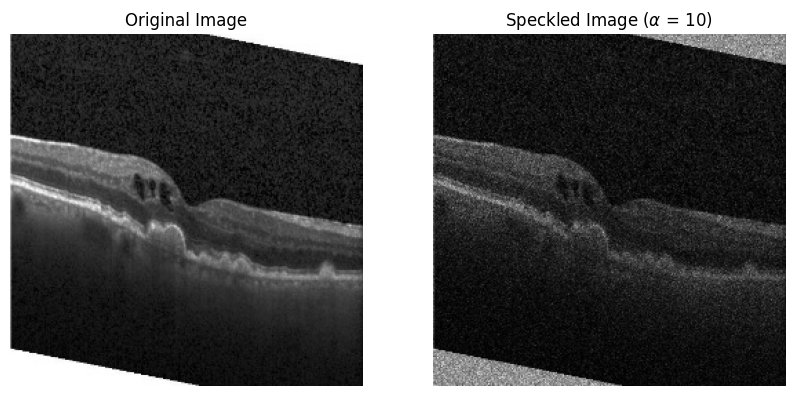

In [ ]:
rand_indx = np.random.randint(0,DRUSEN_length)

plt.figure(figsize=(10,10))

os.chdir(input_DRUSEN_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DRUSEN_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DRUSEN_dir)

DRUSEN_output_images = os.listdir(output_DRUSEN_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DRUSEN_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

4. Normal (NORMAL) Data:

In [ ]:
os.chdir(input_NORMAL_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/NORMAL


In [ ]:
NORMAL_length = get_directory_length(input_NORMAL_dir)

NORMAL_images = os.listdir(input_NORMAL_dir)

Adding Speckle Noise to Data (α = 5):

In [ ]:
for i in range(NORMAL_length):
  pic = cv2.imread(NORMAL_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_NORMAL_dir)
  cv2.imwrite(NORMAL_images[i],newpic)
  os.chdir(input_NORMAL_dir)
  print(str(i+1)+" images have been modified")

Streaming output truncated to the last 5000 lines.
11337 images have been modified
11338 images have been modified
11339 images have been modified
11340 images have been modified
11341 images have been modified
11342 images have been modified
11343 images have been modified
11344 images have been modified
11345 images have been modified
11346 images have been modified
11347 images have been modified
11348 images have been modified
11349 images have been modified
11350 images have been modified
11351 images have been modified
11352 images have been modified
11353 images have been modified
11354 images have been modified
11355 images have been modified
11356 images have been modified
11357 images have been modified
11358 images have been modified
11359 images have been modified
11360 images have been modified
11361 images have been modified
11362 images have been modified
11363 images have been modified
11364 images have been modified
11365 images have been modified
11366 images have bee

Verifying Speckle Addition:

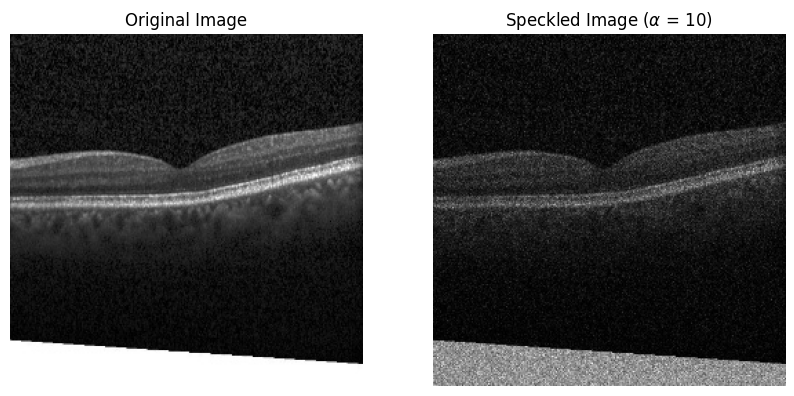

In [ ]:
rand_indx = np.random.randint(0,NORMAL_length)

plt.figure(figsize=(10,10))

os.chdir(input_NORMAL_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(NORMAL_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_NORMAL_dir)

NORMAL_output_images = os.listdir(output_NORMAL_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(NORMAL_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

**TEST DATASETS:**

1. Chroidal Neovascularization (CNV) Data:

In [ ]:
os.chdir(input_CNV_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/CNV


In [ ]:
CNV_test_length = get_directory_length(input_CNV_test_dir)

CNV_test_images = os.listdir(input_CNV_test_dir)

Adding Speckle Noise to Data (α = 5):

In [ ]:
for i in range(CNV_test_length):
  pic = cv2.imread(CNV_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_CNV_test_dir)
  cv2.imwrite(CNV_test_images[i],newpic)
  os.chdir(input_CNV_test_dir)
  print(str(i+1)+" images have been modified")

1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modified
35 images have been mod

Verifying Speckle Addition:

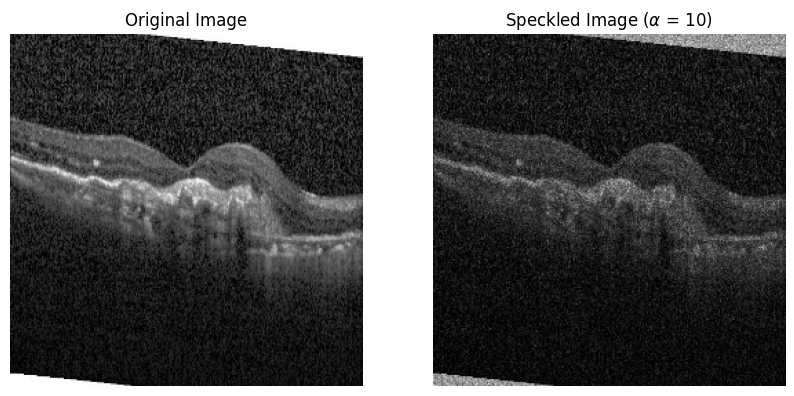

In [ ]:
rand_indx = np.random.randint(0,CNV_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_CNV_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(CNV_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_CNV_test_dir)

CNV_output_test_images = os.listdir(output_CNV_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(CNV_output_test_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

2. Diabetic Macular Edema (DME) Data:

In [ ]:
os.chdir(input_DME_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/DME


In [ ]:
DME_test_length = get_directory_length(input_DME_test_dir)

DME_test_images = os.listdir(input_DME_test_dir)

Adding Speckle Noise to Data (α = 5):

In [ ]:
for i in range(DME_test_length):
  pic = cv2.imread(DME_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DME_test_dir)
  cv2.imwrite(DME_test_images[i],newpic)
  os.chdir(input_DME_test_dir)
  print(str(i+1)+" images have been modified")

1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modified
35 images have been mod

Verifying Speckle Addition:

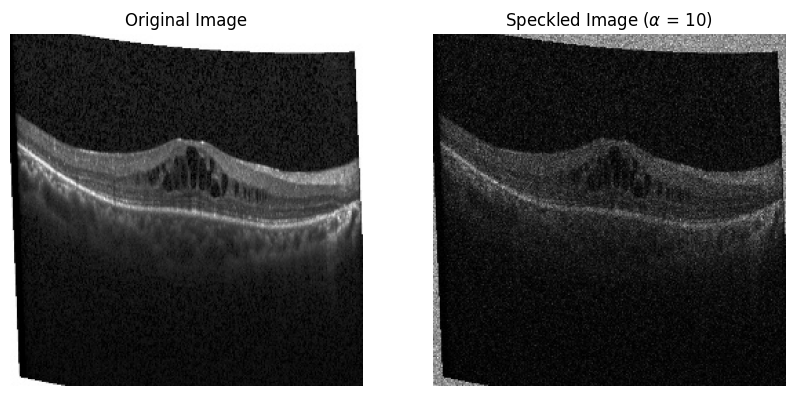

In [ ]:
rand_indx = np.random.randint(0,DME_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_DME_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DME_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DME_test_dir)

DME_output_test_images = os.listdir(output_DME_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DME_output_test_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

3. Drusen (DRUSEN) Data:

In [ ]:
os.chdir(input_DRUSEN_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/DRUSEN


In [ ]:
DRUSEN_test_length = get_directory_length(input_DRUSEN_test_dir)

DRUSEN_test_images = os.listdir(input_DRUSEN_test_dir)

Adding Speckle Noise to Data (α = 5):

In [ ]:
for i in range(DRUSEN_test_length):
  pic = cv2.imread(DRUSEN_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DRUSEN_test_dir)
  cv2.imwrite(DRUSEN_test_images[i],newpic)
  os.chdir(input_DRUSEN_test_dir)
  print(str(i+1)+" images have been modified")

1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modified
35 images have been mod

Verifying Speckle Addition:

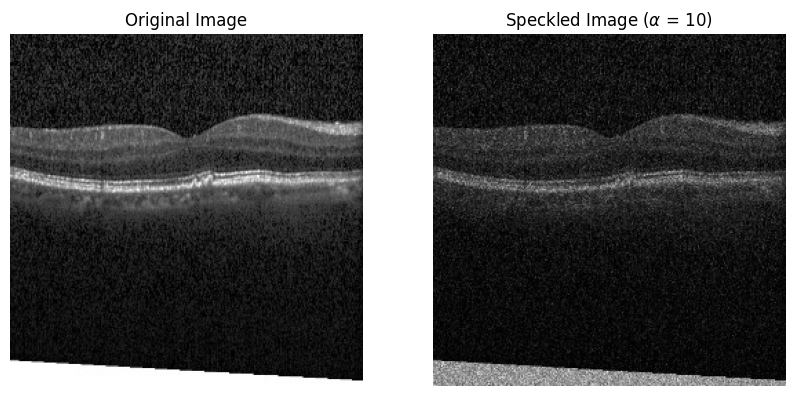

In [ ]:
rand_indx = np.random.randint(0,DRUSEN_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_DRUSEN_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DRUSEN_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DRUSEN_test_dir)

DRUSEN_output_test_images = os.listdir(output_DRUSEN_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DRUSEN_output_test_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

4. Normal (NORMAL) Data:

In [ ]:
os.chdir(input_NORMAL_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/NORMAL


In [ ]:
NORMAL_test_length = get_directory_length(input_NORMAL_test_dir)

NORMAL_test_images = os.listdir(input_NORMAL_test_dir)

Adding Speckle Noise to Data (α = 5):

In [ ]:
for i in range(NORMAL_test_length):
  pic = cv2.imread(NORMAL_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_NORMAL_test_dir)
  cv2.imwrite(NORMAL_test_images[i],newpic)
  os.chdir(input_NORMAL_test_dir)
  print(str(i)+" images have been modified")

0 images have been modified
1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modi

Verifying Speckle Addition:

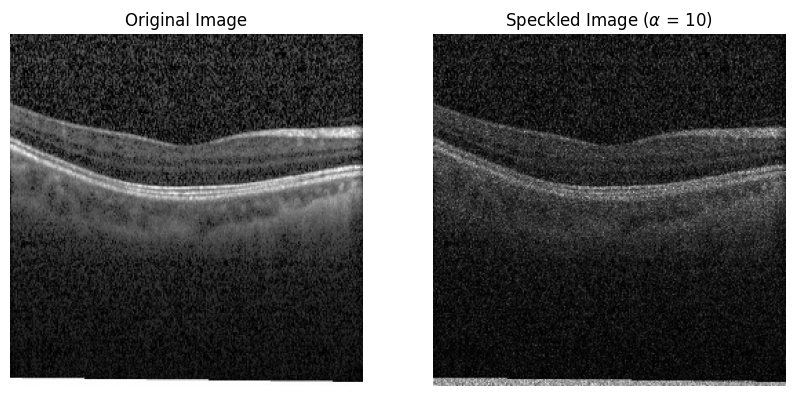

In [ ]:
rand_indx = np.random.randint(0,NORMAL_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_NORMAL_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(NORMAL_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_NORMAL_test_dir)

NORMAL_output_test_images = os.listdir(output_NORMAL_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(NORMAL_output_test_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 10)")
plt.axis('off')

plt.show()

### High Speckle Noise (α = 2.5):

Output Data Directories:

In [ ]:
output_CNV_dir = '/content/drive/MyDrive/OCT High Speckle/train/CNV'
output_DME_dir = '/content/drive/MyDrive/OCT High Speckle/train/DME'
output_DRUSEN_dir = '/content/drive/MyDrive/OCT High Speckle/train/DRUSEN'
output_NORMAL_dir = '/content/drive/MyDrive/OCT High Speckle/train/NORMAL'


output_CNV_test_dir = '/content/drive/MyDrive/OCT High Speckle/test/CNV'
output_DME_test_dir = '/content/drive/MyDrive/OCT High Speckle/test/DME'
output_DRUSEN_test_dir = '/content/drive/MyDrive/OCT High Speckle/test/DRUSEN'
output_NORMAL_test_dir = '/content/drive/MyDrive/OCT High Speckle/test/NORMAL'

Speckle Noise Parameters:

In [ ]:
magDist = ConstantMag
phaseDist = UniformPhase

N = 50

magMean = 10
magVar = 1
phaseMean = 10
phaseVar = 1

alpha = 2.5

image_size = 256

H = image_size
W = image_size

phaseSum = np.zeros((H,W),dtype=complex)

for k in range(H):
  for l in range(W):
      phaseSum[k,l] = randomPhasorSum(N,magDist,magMean,magVar,phaseDist,phaseMean,phaseVar)

**TRAINING DATASETS:**

1. Chroidal Neovascularization (CNV) Data:

In [ ]:
os.chdir(input_CNV_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/CNV


In [ ]:
CNV_length = get_directory_length(input_CNV_dir)

CNV_images = os.listdir(input_CNV_dir)

Adding Speckle Noise to the Data (α = 2.5):

In [ ]:
for i in range(CNV_length):
  pic = cv2.imread(CNV_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_CNV_dir)
  cv2.imwrite(CNV_images[i],newpic)
  os.chdir(input_CNV_dir)
  print(str(i+1)+" images have been modified")

Streaming output truncated to the last 5000 lines.
4496 images have been modified
4497 images have been modified
4498 images have been modified
4499 images have been modified
4500 images have been modified
4501 images have been modified
4502 images have been modified
4503 images have been modified
4504 images have been modified
4505 images have been modified
4506 images have been modified
4507 images have been modified
4508 images have been modified
4509 images have been modified
4510 images have been modified
4511 images have been modified
4512 images have been modified
4513 images have been modified
4514 images have been modified
4515 images have been modified
4516 images have been modified
4517 images have been modified
4518 images have been modified
4519 images have been modified
4520 images have been modified
4521 images have been modified
4522 images have been modified
4523 images have been modified
4524 images have been modified
4525 images have been modified
4526 images have be

Verifying Speckle Addition:

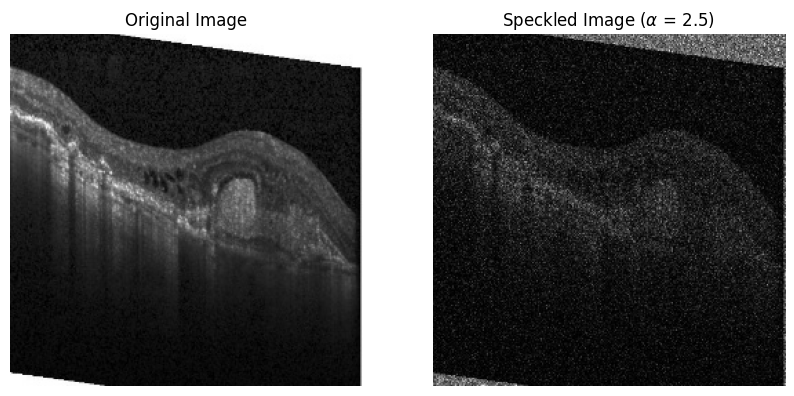

In [ ]:
rand_indx = np.random.randint(0,CNV_length)

plt.figure(figsize=(10,10))

os.chdir(input_CNV_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(CNV_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_CNV_dir)

CNV_output_images = os.listdir(output_CNV_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(CNV_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 2.5)")
plt.axis('off')

plt.show()

2. Diabetic Macular Edema (DME) Data:

In [ ]:
os.chdir(input_DME_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/DME


In [ ]:
DME_length = get_directory_length(input_DME_dir)

DME_images = os.listdir(input_DME_dir)

Adding Speckle Noise to Data (α = 2.5):

In [ ]:
for i in range(DME_length):
  pic = cv2.imread(DME_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DME_dir)
  cv2.imwrite(DME_images[i],newpic)
  os.chdir(input_DME_dir)
  print(str(i+1)+" images have been modified")

Streaming output truncated to the last 5000 lines.
5145 images have been modified
5146 images have been modified
5147 images have been modified
5148 images have been modified
5149 images have been modified
5150 images have been modified
5151 images have been modified
5152 images have been modified
5153 images have been modified
5154 images have been modified
5155 images have been modified
5156 images have been modified
5157 images have been modified
5158 images have been modified
5159 images have been modified
5160 images have been modified
5161 images have been modified
5162 images have been modified
5163 images have been modified
5164 images have been modified
5165 images have been modified
5166 images have been modified
5167 images have been modified
5168 images have been modified
5169 images have been modified
5170 images have been modified
5171 images have been modified
5172 images have been modified
5173 images have been modified
5174 images have been modified
5175 images have be

Verifying Speckle Addition:

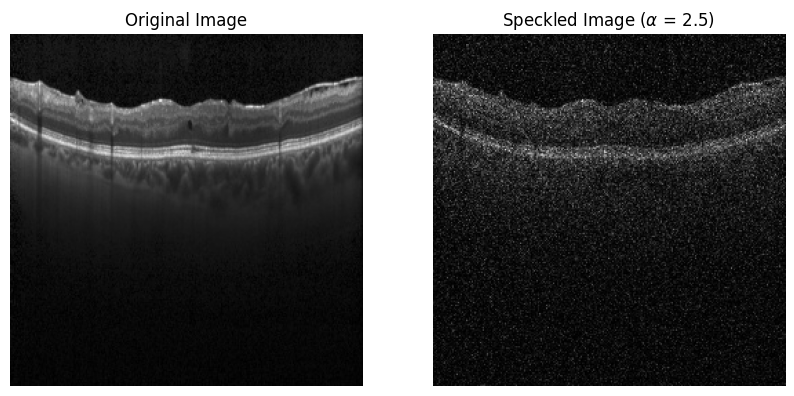

In [ ]:
rand_indx = np.random.randint(0,DME_length)

plt.figure(figsize=(10,10))

os.chdir(input_DME_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DME_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DME_dir)

DME_output_images = os.listdir(output_DME_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DME_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 2.5)")
plt.axis('off')

plt.show()

3. Drusen (DRUSEN) Data:

In [ ]:
os.chdir(input_DRUSEN_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/DRUSEN


In [ ]:
DRUSEN_length = get_directory_length(input_DRUSEN_dir)

DRUSEN_images = os.listdir(input_DRUSEN_dir)

Adding Speckle Noise to Data (α = 2.5):

In [ ]:
for i in range(DRUSEN_length):
  pic = cv2.imread(DRUSEN_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DRUSEN_dir)
  cv2.imwrite(DRUSEN_images[i],newpic)
  os.chdir(input_DRUSEN_dir)
  print(str(i+1)+" images have been modified")

Streaming output truncated to the last 5000 lines.
372 images have been modified
373 images have been modified
374 images have been modified
375 images have been modified
376 images have been modified
377 images have been modified
378 images have been modified
379 images have been modified
380 images have been modified
381 images have been modified
382 images have been modified
383 images have been modified
384 images have been modified
385 images have been modified
386 images have been modified
387 images have been modified
388 images have been modified
389 images have been modified
390 images have been modified
391 images have been modified
392 images have been modified
393 images have been modified
394 images have been modified
395 images have been modified
396 images have been modified
397 images have been modified
398 images have been modified
399 images have been modified
400 images have been modified
401 images have been modified
402 images have been modified
403 images have bee

Verifying Speckle Addition:

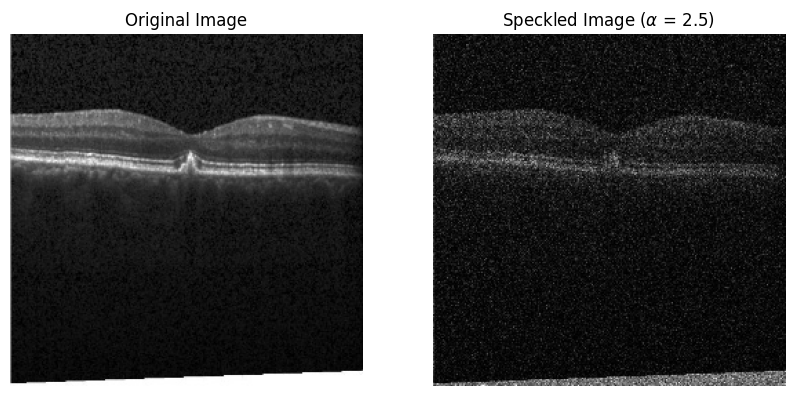

In [ ]:
rand_indx = np.random.randint(0,DRUSEN_length)

plt.figure(figsize=(10,10))

os.chdir(input_DRUSEN_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DRUSEN_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DRUSEN_dir)

DRUSEN_output_images = os.listdir(output_DRUSEN_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DRUSEN_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 2.5)")
plt.axis('off')

plt.show()

4. Normal (NORMAL) Data:

In [ ]:
os.chdir(input_NORMAL_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/train/NORMAL


In [ ]:
NORMAL_length = get_directory_length(input_NORMAL_dir)

NORMAL_images = os.listdir(input_NORMAL_dir)

Adding Speckle Noise to Data (α = 2.5):

In [ ]:
for i in range(NORMAL_length):
  pic = cv2.imread(NORMAL_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_NORMAL_dir)
  cv2.imwrite(NORMAL_images[i],newpic)
  os.chdir(input_NORMAL_dir)
  print(str(i+1)+" images have been modified")

Streaming output truncated to the last 5000 lines.
11337 images have been modified
11338 images have been modified
11339 images have been modified
11340 images have been modified
11341 images have been modified
11342 images have been modified
11343 images have been modified
11344 images have been modified
11345 images have been modified
11346 images have been modified
11347 images have been modified
11348 images have been modified
11349 images have been modified
11350 images have been modified
11351 images have been modified
11352 images have been modified
11353 images have been modified
11354 images have been modified
11355 images have been modified
11356 images have been modified
11357 images have been modified
11358 images have been modified
11359 images have been modified
11360 images have been modified
11361 images have been modified
11362 images have been modified
11363 images have been modified
11364 images have been modified
11365 images have been modified
11366 images have bee

Verifying Speckle Addition:

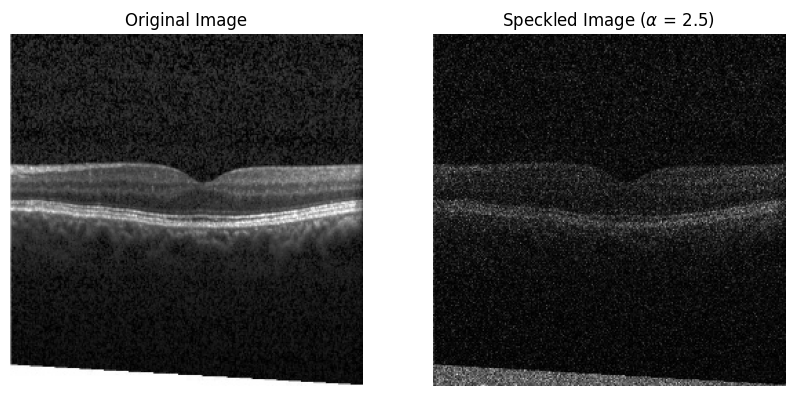

In [ ]:
rand_indx = np.random.randint(0,NORMAL_length)

plt.figure(figsize=(10,10))

os.chdir(input_NORMAL_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(NORMAL_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_NORMAL_dir)

NORMAL_output_images = os.listdir(output_NORMAL_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(NORMAL_output_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 2.5)")
plt.axis('off')

plt.show()

**TEST DATASETS:**

1. Chroidal Neovascularization (CNV) Data:

In [ ]:
os.chdir(input_CNV_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/CNV


In [ ]:
CNV_test_length = get_directory_length(input_CNV_test_dir)

CNV_test_images = os.listdir(input_CNV_test_dir)

Adding Speckle Noise to Data (α = 2.5):

In [ ]:
for i in range(CNV_test_length):
  pic = cv2.imread(CNV_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_CNV_test_dir)
  cv2.imwrite(CNV_test_images[i],newpic)
  os.chdir(input_CNV_test_dir)
  print(str(i+1)+" images have been modified")

1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modified
35 images have been mod

Verifying Speckle Addition:

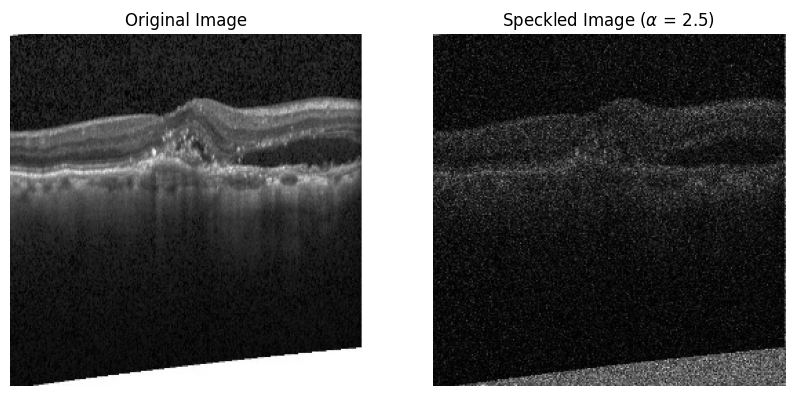

In [ ]:
rand_indx = np.random.randint(0,CNV_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_CNV_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(CNV_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_CNV_test_dir)

CNV_output_test_images = os.listdir(output_CNV_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(CNV_output_test_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 2.5)")
plt.axis('off')

plt.show()

2. Diabetic Macular Edema (DME) Data:

In [ ]:
os.chdir(input_DME_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/DME


In [ ]:
DME_test_length = get_directory_length(input_DME_test_dir)

DME_test_images = os.listdir(input_DME_test_dir)

Adding Speckle Noise to Data (α = 2.5):

In [ ]:
for i in range(DME_test_length):
  pic = cv2.imread(DME_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DME_test_dir)
  cv2.imwrite(DME_test_images[i],newpic)
  os.chdir(input_DME_test_dir)
  print(str(i+1)+" images have been modified")

1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modified
35 images have been mod

Verifying Speckle Addition:

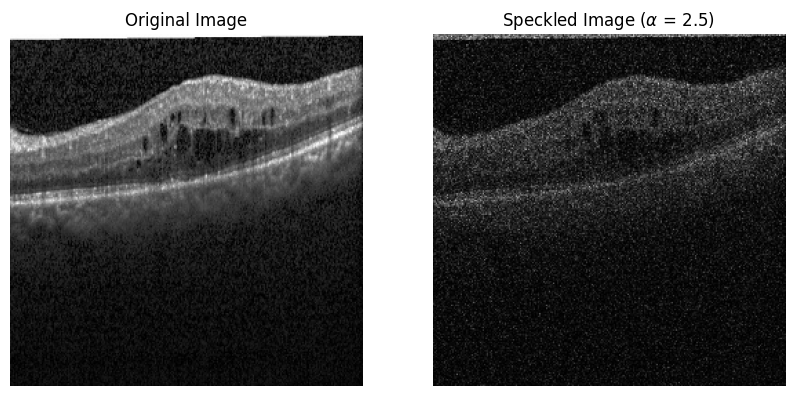

In [ ]:
rand_indx = np.random.randint(0,DME_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_DME_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DME_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DME_test_dir)

DME_output_test_images = os.listdir(output_DME_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DME_output_test_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 2.5)")
plt.axis('off')

plt.show()

3. Drusen (DRUSEN) Data:

In [ ]:
os.chdir(input_DRUSEN_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/DRUSEN


In [ ]:
DRUSEN_test_length = get_directory_length(input_DRUSEN_test_dir)

DRUSEN_test_images = os.listdir(input_DRUSEN_test_dir)

Adding Speckle Noise to Data (α = 2.5):

In [ ]:
for i in range(DRUSEN_test_length):
  pic = cv2.imread(DRUSEN_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_DRUSEN_test_dir)
  cv2.imwrite(DRUSEN_test_images[i],newpic)
  os.chdir(input_DRUSEN_test_dir)
  print(str(i+1)+" images have been modified")

1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modified
35 images have been mod

Verifying Speckle Addition:

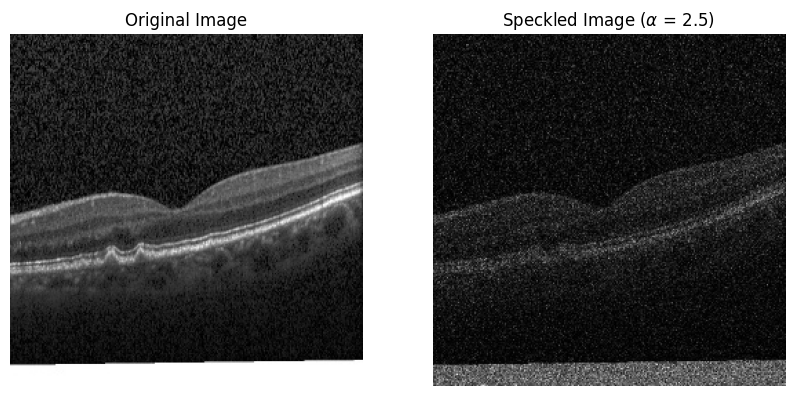

In [ ]:
rand_indx = np.random.randint(0,DRUSEN_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_DRUSEN_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(DRUSEN_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_DRUSEN_test_dir)

DRUSEN_output_test_images = os.listdir(output_DRUSEN_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(DRUSEN_output_test_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 2.5)")
plt.axis('off')

plt.show()

4. Normal (NORMAL) Data:

In [ ]:
os.chdir(input_NORMAL_test_dir)

In [ ]:
!pwd

/content/drive/MyDrive/OCT Resized/test/NORMAL


In [ ]:
NORMAL_test_length = get_directory_length(input_NORMAL_test_dir)

NORMAL_test_images = os.listdir(input_NORMAL_test_dir)

Adding Speckle Noise to Data (α = 2.5):

In [ ]:
for i in range(NORMAL_test_length):
  pic = cv2.imread(NORMAL_test_images[i])
  pic = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)

  newpic = np.add(np.multiply(alpha,np.sqrt(pic)),phaseSum)
  newpic = np.square(np.abs(newpic))
  newpic = np.divide(newpic,np.max(np.max(newpic)))
  newpic = np.multiply(newpic,255)

  os.chdir(output_NORMAL_test_dir)
  cv2.imwrite(NORMAL_test_images[i],newpic)
  os.chdir(input_NORMAL_test_dir)
  print(str(i+1)+" images have been modified")

1 images have been modified
2 images have been modified
3 images have been modified
4 images have been modified
5 images have been modified
6 images have been modified
7 images have been modified
8 images have been modified
9 images have been modified
10 images have been modified
11 images have been modified
12 images have been modified
13 images have been modified
14 images have been modified
15 images have been modified
16 images have been modified
17 images have been modified
18 images have been modified
19 images have been modified
20 images have been modified
21 images have been modified
22 images have been modified
23 images have been modified
24 images have been modified
25 images have been modified
26 images have been modified
27 images have been modified
28 images have been modified
29 images have been modified
30 images have been modified
31 images have been modified
32 images have been modified
33 images have been modified
34 images have been modified
35 images have been mod

Verifying Speckle Addition:

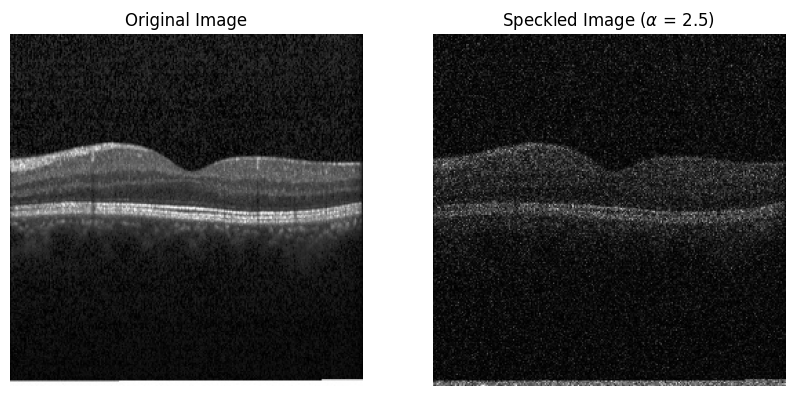

In [ ]:
rand_indx = np.random.randint(0,NORMAL_test_length)

plt.figure(figsize=(10,10))

os.chdir(input_NORMAL_test_dir)

plt.subplot(1,2,1)
plt.imshow(cv2.imread(NORMAL_test_images[rand_indx]),cmap='gray')
plt.title("Original Image")
plt.axis('off')

os.chdir(output_NORMAL_test_dir)

NORMAL_output_test_images = os.listdir(output_NORMAL_test_dir)

plt.subplot(1,2,2)
plt.imshow(cv2.imread(NORMAL_output_test_images[rand_indx]),cmap='gray')
plt.title("Speckled Image ($\\alpha$ = 2.5)")
plt.axis('off')

plt.show()